# Comparison between Dantec DynamicStudio and OpenPIV
*Francesca Iapaolo, Energy Department, Politecnico di Milano*


## 1. Introduction

In recent years Python programming language is being used more and more in the academic and scientific field. Moreover, researchers from all over the world became to develop their programs in this language and to publish them on the web allowing their usage to researches interested in integrating this scipts in their work. In this framework, a lot of open-sorce softwares have been released and the one that will be used in this work is called OpenPIV.  
In this project, a set of images acquired during an experimental campaign led on an air-hydrogen flame will be analysed with two different cross-correlation algorithms in order to apply the Background Oriented Schlieren (BOS) technique. In fact, starting from the acquired images, the technique consists in analysing them with a cross correlation algorithm to compute the displacement maps caused by the flame presence.  
In general, the cross-correlation algorithms are implemented and developed tu run Particle Image Velocimetry (PIV) technique. Nevertheless, applying some precautions, these can be used in BOS analysis. There exist different cross-correlation algorithms developed for such applications: some of them require the purchase of a license, while other are open-source softwares.  
The objective of this project is to analyse 100 images acquired during the experimental tests with two different cross-correlation algorithms and compare the resulting displacement maps. The first algorithm is a function comprised in the DynamicStudio 7.3 software. It has been developed by Dantec Dynamics and the purchase of a valid license ir required. The second software is called OpenPIV and the installation guide is provided at the following link http://www.openpiv.net/. OpenPIV is an open-source library developed in defferent programming languages existing since 1999. Since the most updated version is the one developed in Python language (as reported in the website), the results computed with this algorithm will be compared to those obtained with DynamicStudio 7.3.

## 2. Background Oriented Schlieren technique

The Background Oriented Schlieren is a density-gradient-based optical technique characterized by simple and cheap setup composed by only a camera and a display which is used to show a background. The latter is usally characterized by a black background with white randomly-displaced particles. The technique requires the acquisition of at least two images: the first picture is a photo of the background which is usually called undistorted image; the second image is shot with the so-called Schlieren object placed in between the background and the camera. The second image appears distorted due to the Schlieren object which is characterized by a non-homogeneous refractive index field. In fact, considering the Gladsone-Dale equation, the refractive index of a gas mixture is related to its density. For an ideal gas mixture, the latter is related to pressure, temperature and composition. In the case analysed, pressure is constant and the refractive index changes due to both temperature gradients in the flame and composition distribution in the space (exhaust gas mixture, fresh mixture and ambient air). Because of light refraction phenomenon, the light-rays passing through the object are deflected while those passing in the ambient air will pass undisturbed. Thanks to this, in the secondod image the particles of the background will appear displaced with respect to those in the undistorted image. In the case here analysed, the Schlieren object is an air-hydrogen flame in lean conditions (equivalence ratio is 0,45) and 1kW thermal power.

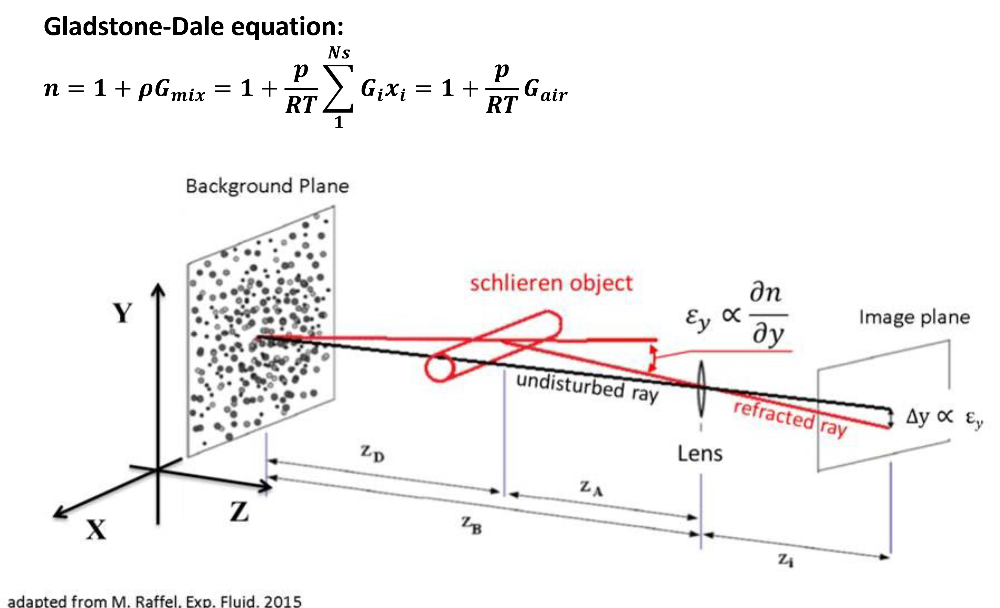

## 3. Workflow

To achieve the objectives already mentioned, it has been necessary to install the OpenPIV software. This part is not reported here, as it can be found on the official website (http://www.openpiv.net/).  
Being the first time that the OpenPIV software is applied by the author, after having read the user guide, the software will be tested to understed the correct funtioning by imposing known displacements. To this scope, the results will be then compared to those obtained with DynamicStudio 7.3.
The second step is then to analyse the images acquired during the experimental campaign led in the "Laboratory of Combustion and Optical Diagnostic Techniques" on an air-hydrogen flame. Since it is necessary to have a non-distorted background for each distorted image acquired (N=100), the background image is copied and saved 100 times.
Finally, the OpenPIV algorithm is applied on the 100 couples of images to obtain 100 displacements maps which will be averaged to compute the average displacement map. Therefore, the latter will be compared to the average displacement map computed in DynamicStudio 7.3.

## 4 Script

In this chapter it is reported the complete code written in Python language with some comments aiming to explain each section and the reasoning behind the script.

### 4.1 Testing OpenPIV with synthetic displacements

In order to understand if OpenPIV is working in the desired way and if the parameters chosen to run the analysis is providing reliable results, it is possible to make a test imposing known diplacements. This has been done by generating a rotated background (rotation of 1° in clock-wise direction) to be compared to the original one by cross-correlation. This strategy allows to test a wide range of displacements (in terms of vector module and direction) wich are null in the center of the image and increase moving towards the corners.  
At this point, two images have been acquired: the first with the original background and the second with the rotated one. The couple of images is analysed with the two algorithms to compute the dsiplacements maps in order to understand if OpenPIV is working in the proper way.

#### 4.1.1 Display acquired images

The following code is used to import and display the images acquired in the laboratory with the original background (Figure 1) and the rotated one (Figure 2).
The images are assigned to *frame_a* and *frame_b*.

Text(0.5, 1.0, 'Figure 2: Acquisition with rotated background')

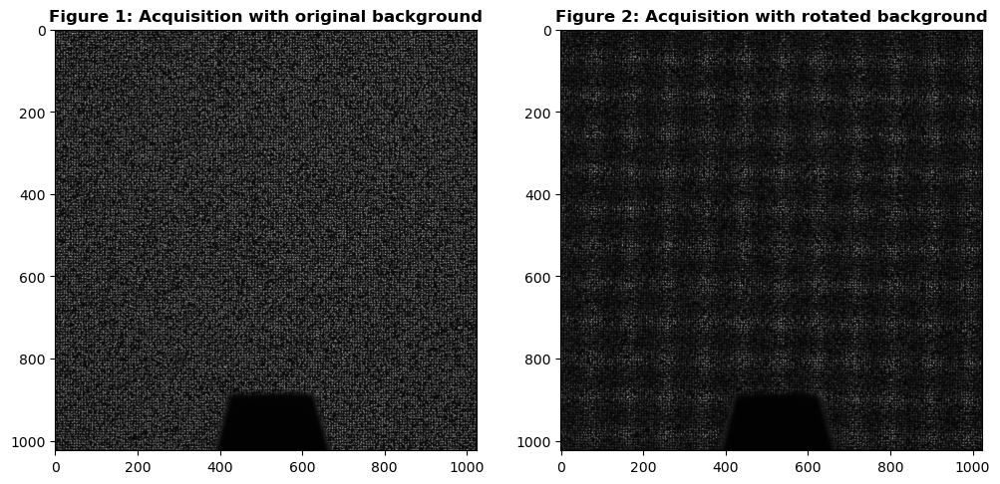

In [1]:
from openpiv import tools

#import imageio
import importlib_resources
#import pathlib

# Image file path
path = importlib_resources.files('08-24-2023_Synthetic_displacements')
# Import images
frame_a  = tools.imread( path / 'f22_ET64000/01_Shlieren_acquisition_undistorted.tif')
frame_b  = tools.imread( path / 'f22_ET64000/01_Shlieren_acquisition_distorted.tif')

import matplotlib.pyplot as plt
# Display images to be analysed
fig,ax = plt.subplots(1,2,figsize=(12,10))
ax[0].imshow(frame_a,cmap='gray')
ax[1].imshow(frame_b,cmap='gray')
ax[0].set_title('Figure 1: Acquisition with original background', fontweight='bold')
ax[1].set_title('Figure 2: Acquisition with rotated background', fontweight='bold')

#### 4.1.2 Set OpenPIV parameters and compute displacements [pixels]

The next step is to set the cross-correlation parameters such as: interrogation area size in pixels, window overlapping in pixels and the time interval between two consecutive frames. The latter is a parameter very important when performing PIV analysis in which the frames are acquired at fixed time intervals to determine the particles velocity field. In this case it is of interest to compute a dispacement map and the time interval is arbitrarily set equal to 1 second.

In [2]:
from openpiv import pyprocess
import numpy as np

# Set cross-correlation settings
winsize = 32 # pixels, interrogation window size in frame A
searchsize = 32  # pixels, search area size in frame B
overlap = 16 # pixels, 50% overlap
dt = 1 # sec, time interval between the two frames

u0, v0, sig2noise = pyprocess.extended_search_area_piv(
    frame_a.astype(np.int32),
    frame_b.astype(np.int32),
    window_size=winsize,
    overlap=overlap,
    dt=dt,
    search_area_size=searchsize,
    sig2noise_method='peak2peak',
)

# Obtain the coordinates of IA's
x, y = pyprocess.get_coordinates(
    image_size=frame_a.shape,
    search_area_size=searchsize,
    overlap=overlap,
)

#### 4.1.3 Results validation

At this point it is possible to run a validation function provided in OpenPIV library based on the ratio signal-to-noise. To set the threshold value it is possible to display the plot reported above which counts the density distribution of the S/N ratio.

(array([ 444.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        3525.]),
 array([0.        , 0.10683077, 0.21366154, 0.32049231, 0.42732309,
        0.53415386, 0.64098463, 0.7478154 , 0.85464617, 0.96147694,
        1.06830772]),
 <BarContainer object of 10 artists>)

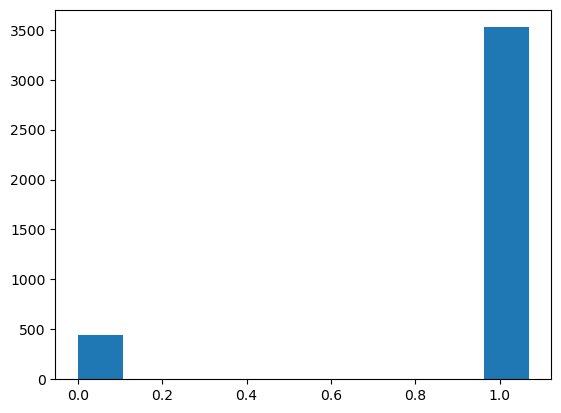

In [3]:
plt.hist(sig2noise.flatten())

Once established the S/N trashold it is possible to run the validation fuction which provides a matrices of True and False values corresponding to vectors charachterized by low S/N value.

In [4]:
from openpiv import validation

# Data validation
s2n_threshold=0.5
mask_s2n = validation.sig2noise_val(sig2noise, threshold = s2n_threshold )
mask_g = validation.global_val( u0, v0, (-1000, 1000), (-1000, 1000) )
invalid = mask_s2n | mask_g

#### 4.1.4 Displacements rescaling

To scale displacement from pixels to millimeters it is possible to use the scaling function provided by OpenPIV library.

In [5]:
from openpiv import scaling

x, y, u3, v3 = scaling.uniform(
    x, y, u0, v0,
    scaling_factor = 1024/61,  # pixels/millimeter
)

# 0,0 shall be bottom left, positive rotation rate is counterclockwise
x, y, u3, v3 = tools.transform_coordinates(x, y, u3, v3)

#### 4.1.5 Plot results

In this section it is reported the code used to display the results of the analysis which are the axial and radial displacement (*u3* and *v3*). By combining the two components it is possible to obtain the displacement modulus.

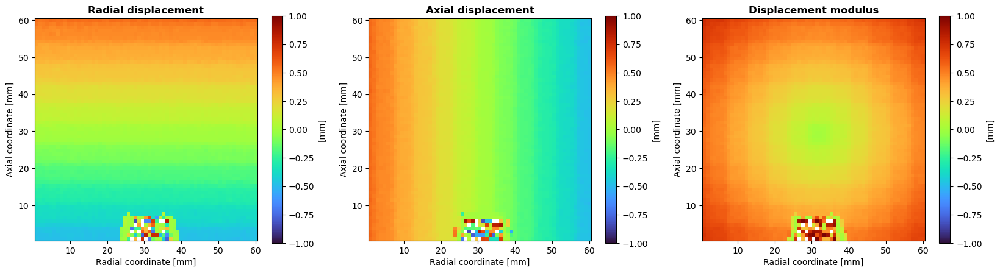

In [6]:
# Plot cross-correlation results
fig, ax = plt.subplots(1, 3, figsize=(20,20))

im = ax[0].pcolormesh(x, y, u3, vmin=-1, vmax=1, cmap="turbo")
ax[0].set_title("Radial displacement", fontweight='bold')
ax[0].set_xlabel("Radial coordinate [mm]")
ax[0].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[0], label="[mm]", shrink=0.242)
ax[0].set_aspect("equal")
#plt.show()

im = ax[1].pcolormesh(x, y, v3, vmin=-1, vmax=1, cmap="turbo")
ax[1].set_title("Axial displacement", fontweight='bold')
ax[1].set_xlabel("Radial coordinate [mm]")
ax[1].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[1], label="[mm]", shrink=0.242)
ax[1].set_aspect("equal")

im = ax[2].pcolormesh(x, y, np.sqrt((u3**2+v3**2)), vmin=-1, vmax=1, cmap="turbo")
ax[2].set_title("Displacement modulus", fontweight='bold')
ax[2].set_xlabel("Radial coordinate [mm]")
ax[2].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[2], label="[mm]", shrink=0.242)
ax[2].set_aspect("equal")

#### 4.1.5 Save to an Excel file synthetic displacement results

To save the results of the OpenPIV analysis as an Excel file, it is used the pandas package. Data are firstly stored in a DataFrame and then exported.

In [7]:
import pandas as pd

xl=np.ravel(x)
yl=np.ravel(y)
u3l=np.ravel(u3)
v3l=np.ravel(v3)
values=np.transpose(np.array([xl, yl, u3l, v3l]))
exportData=pd.DataFrame(values, columns=['x', 'y', 'u3', 'v3'])
exportData.to_excel("08-24-2023_Synthetic_displacements/f22_ET64000/DEMO_Displacement_map_OpenPIV.xlsx", float_format="%.10f")

### 4.2 Comparison with DynamicStudio synthetic displacements

In this script results computed with DynamicStudio 7.3 are uploaded from an Excel file in a DataFrame. Then the columns containing X and Y coordinates, the velocity modulus and the radial and axial components are extracted and reshaped to obtain matrices.
More precisely, velocities values need to be transformed in displacements (from m/s to mm) by multiplying for the set time interval (dt=10s).

In [8]:
# Import of average displacement map from an Excel file
imported_data = pd.read_excel("08-24-2023_Synthetic_displacements/f22_ET64000/05-25-2023_f22_64000.xlsx",header=10,dtype={"MyInts": "float64", "MyText": str})

# Axis correction
imported_data["X (mm)[mm]"] = imported_data["X (mm)[mm]"]-imported_data.loc[0,"X (mm)[mm]"]
imported_data["Y (mm)[mm]"] = imported_data["Y (mm)[mm]"]-imported_data.loc[0,"Y (mm)[mm]"]

# Extract DataFrame column and assign to a matrix
X_mm = np.reshape(pd.Series.to_numpy(imported_data["X (mm)[mm]"]), [509,510])     #[mm]
Y_mm = np.reshape(pd.Series.to_numpy(imported_data["Y (mm)[mm]"]), [509,510])     #[mm]
rad_disp = np.reshape(pd.Series.to_numpy(imported_data["U[m/s]"]), [509,510])*10*1000    #[mm]
ax_disp = np.reshape(pd.Series.to_numpy(imported_data["V[m/s]"]), [509,510])*10*1000     #[mm]
mod_disp = np.reshape(pd.Series.to_numpy(imported_data["Length[m/s]"]), [509,510])*10*1000    #[mm] 

The displacements maps computed with DynamicStudio 7.3 and OpenPIV are here plotted to run a comparison.

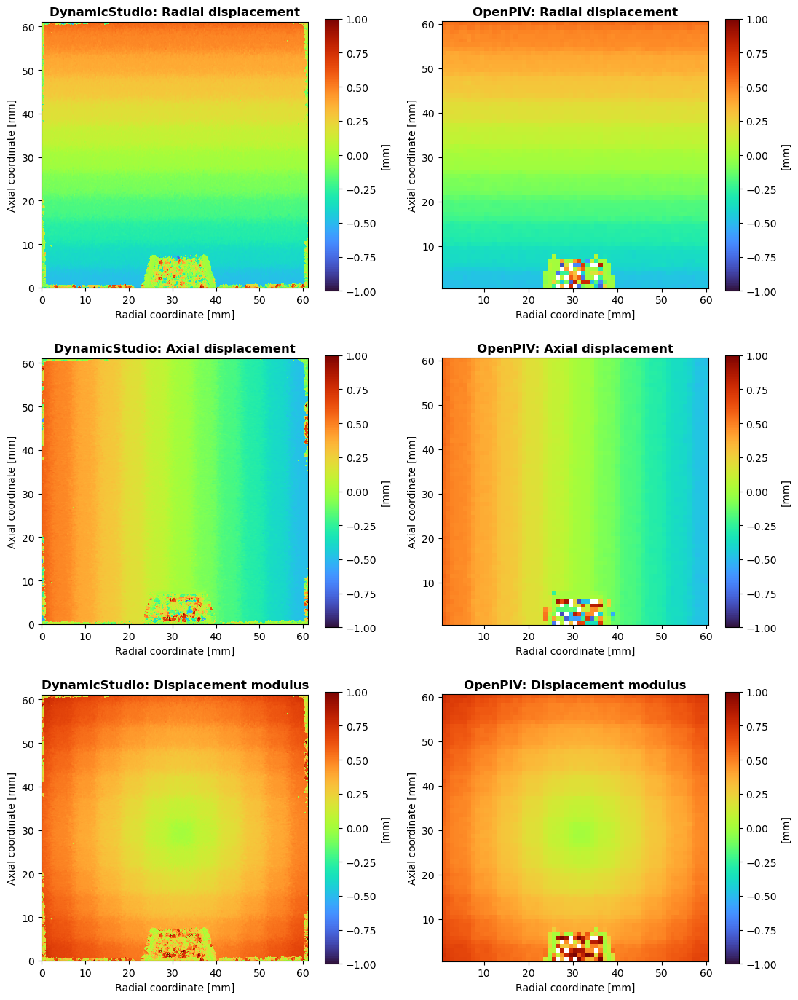

In [9]:
fig, ax = plt.subplots(3, 2, figsize=(13,17))

im = ax[(0,0)].pcolormesh(X_mm, Y_mm, rad_disp, vmin=-1, vmax=1, cmap="turbo")
ax[(0,0)].set_title("DynamicStudio: Radial displacement", fontweight='bold')
ax[(0,0)].set_xlabel("Radial coordinate [mm]")
ax[(0,0)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(0,0)], label="[mm]", shrink=0.97)
ax[(0,0)].set_aspect("equal")

im = ax[(1,0)].pcolormesh(X_mm, Y_mm, ax_disp, vmin=-1, vmax=1, cmap="turbo")
ax[(1,0)].set_title("DynamicStudio: Axial displacement", fontweight='bold')
ax[(1,0)].set_xlabel("Radial coordinate [mm]")
ax[(1,0)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(1,0)], label="[mm]", shrink=0.97)
ax[(1,0)].set_aspect("equal")

im = ax[(2,0)].pcolormesh(X_mm, Y_mm, mod_disp, vmin=-1, vmax=1, cmap="turbo")
ax[(2,0)].set_title("DynamicStudio: Displacement modulus", fontweight='bold')
ax[(2,0)].set_xlabel("Radial coordinate [mm]")
ax[(2,0)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(2,0)], label="[mm]", shrink=0.97)
ax[(2,0)].set_aspect("equal")

im = ax[(0,1)].pcolormesh(x, y, u3, vmin=-1, vmax=1, cmap="turbo")
ax[(0,1)].set_title("OpenPIV: Radial displacement", fontweight='bold')
ax[(0,1)].set_xlabel("Radial coordinate [mm]")
ax[(0,1)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(0,1)], label="[mm]", shrink=0.97)
ax[(0,1)].set_aspect("equal")

im = ax[(1,1)].pcolormesh(x, y, v3, vmin=-1, vmax=1, cmap="turbo")
ax[(1,1)].set_title("OpenPIV: Axial displacement", fontweight='bold')
ax[(1,1)].set_xlabel("Radial coordinate [mm]")
ax[(1,1)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(1,1)], label="[mm]", shrink=0.97)
ax[(1,1)].set_aspect("equal")

im = ax[(2,1)].pcolormesh(x, y, np.sqrt((u3**2+v3**2)), vmin=-1, vmax=1, cmap="turbo")
ax[(2,1)].set_title("OpenPIV: Displacement modulus", fontweight='bold')
ax[(2,1)].set_xlabel("Radial coordinate [mm]")
ax[(2,1)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(2,1)], label="[mm]", shrink=0.97)
ax[(2,1)].set_aspect("equal")

### 4.3 Compute displacement map with experimental data (air-hydrogen flame)

In this chapter is reported the script used to compute di average displacement map which will be compared to that obtainad with DynamicStudio 7.3 to understand if the results computed with the two softwares are comparable.

#### 4.3.1 Make N copies of an image
During the experimental campaign a set of 100 images was acquired (distorted images) and only a single image of the background without flame presence (undistorted background). Because the 100 distorted images must be compared with a set of 100 undistorted backgrounds, it is necessary to make 100 copies of the acquired background.
In the following script the image to copy is uploaded and then saved 100 times with a different file name.

In [10]:
from PIL import Image
#Open image using Image module
im = Image.open("02-24-2023_Experimental_data/Backgrounds/01_background_acquisition.tif")
N=100
i=1
while i<N+1:
    filename = "02-24-2023_Experimental_data/Backgrounds/Copy_" + str(i) + ".tif"
    im.save(filename)
    i=i+1

#### 4.3.2 Compute N displacement maps with OpenPIV
At this point it is possible to compute the 100 displacement maps with OpenPIV module by running the cross-correlation on the 100 couples of images.
The cross-correlation settings are choosen in order to have a comparable number of elements in the displacement maps with respect to those obtained with DynamicStudio 7.3.  
Because of the long runtime, the while loop is used only to demonstrate the correct functioning for two couples of images. Neverthless, the 100 images have been analysed in the past days and the 100 displacements maps have been saved.  
In the while loop, at each iteration it is acquired a couple of images and the displacement maps are computed with OpenPIV. Then the results are exported to an external Excel file. In addition, at each iteration the images uploaded and the resulting displacement maps are shown.

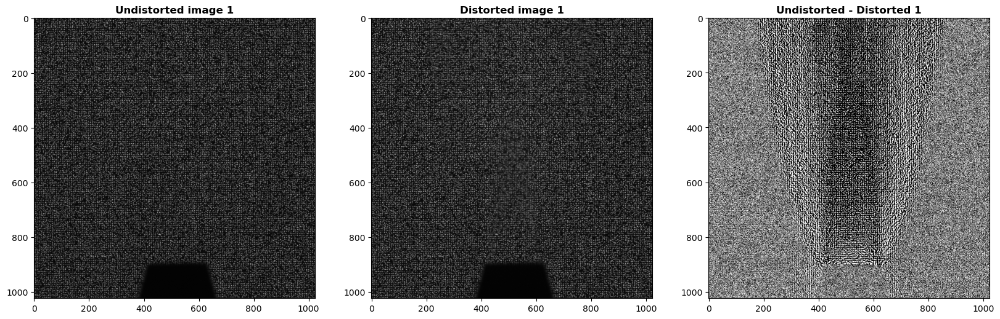

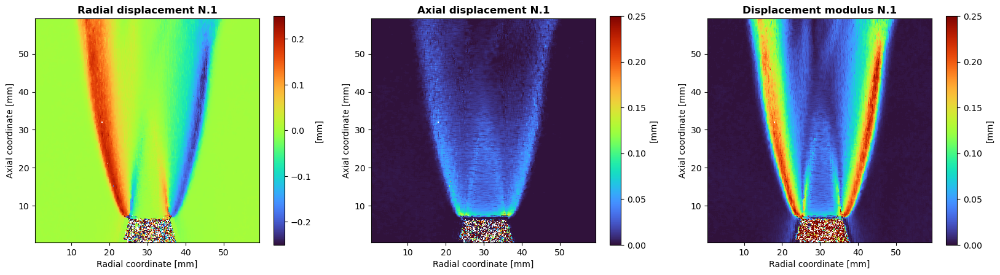

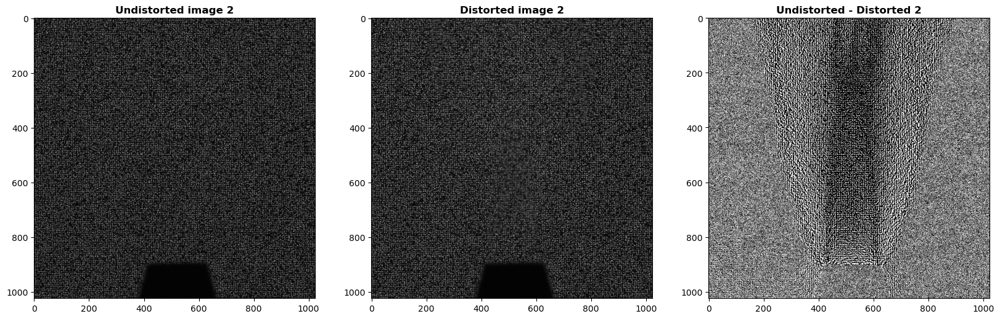

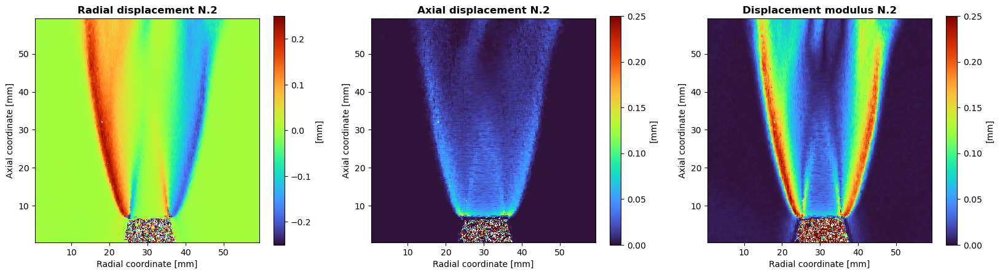

In [12]:
# Image file path
path = importlib_resources.files('02-24-2023_Experimental_data')

N = 2
i=1

while i<N+1:
    # Import images
    image_a_name = 'Backgrounds/Copy_' + str(i) + '.tif'
    image_b_name = 'Schlieren acquisitions/0' + str(i) + '_Shlieren_acquisition.tif'
    frame_a  = tools.imread( path / image_a_name)
    frame_b  = tools.imread( path / image_b_name)
    sub = -frame_a+frame_b

    #Display images acquired during testing phase to be analysed
    fig,ax = plt.subplots(1,3,figsize=(20,10))
    ax[0].imshow(frame_a,cmap='gray')
    ax[1].imshow(frame_b,cmap='gray')
    ax[2].imshow(sub,cmap='gray')
    ax[0].set_title('Undistorted image ' + str(i), fontweight='bold')
    ax[1].set_title('Distorted image ' + str(i), fontweight='bold')
    ax[2].set_title('Undistorted - Distorted ' + str(i), fontweight='bold')
    ax[0].set_aspect("equal")
    ax[1].set_aspect("equal")
    ax[2].set_aspect("equal")
    ax[2].set_ylim(1024,0)

    # Set cross-correlation settings
    winsize = 16 # pixels, interrogation window size in frame A
    searchsize = 16  # pixels, search area size in frame B
    overlap = 14 # pixels, 50% overlap
    dt = 1 # sec, time interval between the two frames

    u0, v0, sig2noise = pyprocess.extended_search_area_piv(
        frame_a.astype(np.int32),
        frame_b.astype(np.int32),
        window_size=winsize,
        overlap=overlap,
        dt=dt,
        search_area_size=searchsize,
        sig2noise_method='peak2peak',
    )


    x, y = pyprocess.get_coordinates(
        image_size=frame_a.shape,
        search_area_size=searchsize,
        overlap=overlap,
    )

    plt.hist(sig2noise.flatten())

    # Data validation
    s2n_threshold=0.5
    mask_s2n = validation.sig2noise_val(sig2noise, threshold = s2n_threshold )
    mask_g = validation.global_val( u0, v0, (-1000, 1000), (-1000, 1000) )
    invalid = mask_s2n | mask_g

    # Scaling from pixels to millimiers
    x, y, u3, v3 = scaling.uniform(
        x, y, u0, v0,
        scaling_factor = 1024/59.7,  # pixels/millimeter
    )

    # 0,0 shall be bottom left, positive rotation rate is counterclockwise
    x, y, u3, v3 = tools.transform_coordinates(x, y, u3, v3)

    # To export the displacement map
    xl=np.ravel(x)
    yl=np.ravel(y)
    u3l=np.ravel(u3)
    v3l=np.ravel(v3)
    values=np.transpose(np.array([xl, yl, u3l, v3l]))
    exportData=pd.DataFrame(values, columns=['x', 'y', 'u3', 'v3'])
    exportData.to_excel("02-24-2023_Experimental_data/OpenPIV results/Open_PIV_DEMO_displacements_0" + str(i) + ".xlsx", float_format="%.10f")
    
    # Plot displacement maps
    fig, ax = plt.subplots(1, 3, figsize=(20, 10))

    im = ax[0].pcolormesh(x, y, u3, vmin=-0.25, vmax=0.25, cmap="turbo")
    ax[0].set_title("Radial displacement N." + str(i), fontweight='bold')
    ax[0].set_xlabel("Radial coordinate [mm]")
    ax[0].set_ylabel("Axial coordinate [mm]")
    fig.colorbar(im, ax=ax[0], label="[mm]", shrink=0.242)
    ax[0].set_aspect("equal")

    im = ax[1].pcolormesh(x, y, v3, vmin=0, vmax=0.25, cmap="turbo")
    ax[1].set_title("Axial displacement N." + str(i), fontweight='bold')
    ax[1].set_xlabel("Radial coordinate [mm]")
    ax[1].set_ylabel("Axial coordinate [mm]")
    fig.colorbar(im, ax=ax[1], label="[mm]", shrink=0.242)
    ax[1].set_aspect("equal")

    im = ax[2].pcolormesh(x, y, np.sqrt((u3**2+v3**2)), vmin=0, vmax=0.25, cmap="turbo")
    ax[2].set_title("Displacement modulus N." + str(i), fontweight='bold')
    ax[2].set_xlabel("Radial coordinate [mm]")
    ax[2].set_ylabel("Axial coordinate [mm]")
    fig.colorbar(im, ax=ax[2], label="[mm]", shrink=0.242)
    ax[2].set_aspect("equal")
    
    i = i+1

Once computed the 100 diplacement maps, it is necessary to compute and to export the average displacement map. In the following it is reported the script used to achieve this result. As previously, the while loop is executed only two times because the complete process (mean over 100 displacement maps) is highly time-consuming.  
At each iteration, it is uploaded the Excel files and data are stored in a dataframe. Values are then divided in radial and axial component vectors. At the first iteration, the values are stored in *rad_disp* and *ax_disp*; while at the following iterations, imported datas are summed to *rad_disp* and *ax_disp*. At the end, the radial and axial displacement vectors are divided by the total number of maps summed to obtain the average displacement vectors. At the end, the results are saved in an Excel file.

In [13]:
counter=2
i=1

while i<counter+1:
    imported_data = pd.read_excel('02-24-2023_Experimental_data/OpenPIV results/Open_PIV_DEMO_displacements_0' + str(i) + '.xlsx',dtype={"MyInts": "float64", "MyText": str})
    
    if i==1:
        image_size = imported_data.loc[imported_data.shape[0]-1,"x"]+imported_data.loc[0,"x"]      #[mm]
        N=int(np.sqrt(imported_data.shape[0]))
        X_mm = np.reshape(pd.Series.to_numpy(imported_data['x']), [N,N])  #[mm]
        Y_mm = np.reshape(pd.Series.to_numpy(imported_data['y']), [N,N]) #[mm]
    u3 = np.reshape(pd.Series.to_numpy(imported_data['u3']), [N,N])    #[mm]
    v3 = np.reshape(pd.Series.to_numpy(imported_data['v3']), [N,N])    #[mm]
    
    if i==1:
        rad_disp = u3
        ax_disp = v3
    else :
        rad_disp = rad_disp + u3
        ax_disp = ax_disp + v3

    i = i+1
    
rad_disp = rad_disp/counter
ax_disp = ax_disp/counter

# Save average displacement vectors                          
xl=np.ravel(X_mm)
yl=np.ravel(Y_mm)
u3l=np.ravel(rad_disp)
v3l=np.ravel(ax_disp)
values=np.transpose(np.array([xl, yl, u3l, v3l]))
exportData=pd.DataFrame(values, columns=['x', 'y', 'u3', 'v3'])
exportData.to_excel("02-24-2023_Experimental_data/OpenPIV results/Open_PIV_DEMO_Average_displacement_map.xlsx", float_format="%.10f")

The average displacement computed in the previous days starting from the 100 displacement maps is uploaded and displayed by using the script reported here.

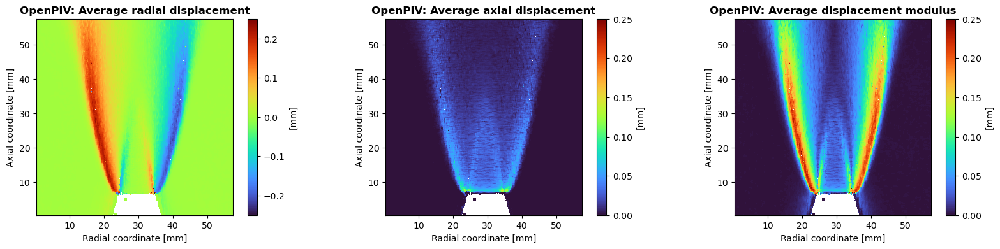

In [14]:
# Import OpenPIV average displacement map
imported_data = pd.read_excel('02-24-2023_Experimental_data/OpenPIV results/Open_PIV_Average_displacement_map.xlsx',dtype={"MyInts": "float64", "MyText": str})
opiv_image_size = imported_data.loc[imported_data.shape[0]-1,"x"]+imported_data.loc[0,"x"]      #[mm]
N=int(np.sqrt(imported_data.shape[0]))

# To store the center of IA's
opiv_cent_x = np.reshape(pd.Series.to_numpy(imported_data['x']), [N,N])  #[mm]
opiv_cent_y = np.reshape(pd.Series.to_numpy(imported_data['y']), [N,N])  #[mm]
opiv_rad_disp = np.reshape(pd.Series.to_numpy(imported_data['u3']), [N,N])   #[mm]
opiv_ax_disp = np.reshape(pd.Series.to_numpy(imported_data['v3']), [N,N])    #[mm]
opiv_mod_disp = np.sqrt((opiv_rad_disp**2+opiv_ax_disp**2))

# To plot displacement maps
fig, ax = plt.subplots(1, 3, figsize=(20, 4))

im = ax[0].pcolormesh(opiv_cent_x, opiv_cent_y, opiv_rad_disp, vmin=-0.25, vmax=0.25, cmap="turbo")
ax[0].set_title("OpenPIV: Average radial displacement", fontweight='bold')
ax[0].set_xlabel("Radial coordinate [mm]")
ax[0].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[0], label="[mm]")
ax[0].set_aspect("equal")

im = ax[1].pcolormesh(opiv_cent_x, opiv_cent_y, opiv_ax_disp, vmin=0, vmax=0.25, cmap="turbo")
ax[1].set_title("OpenPIV: Average axial displacement", fontweight='bold')
ax[1].set_xlabel("Radial coordinate [mm]")
ax[1].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[1], label="[mm]")
ax[1].set_aspect("equal")

im = ax[2].pcolormesh(opiv_cent_x, opiv_cent_y, opiv_mod_disp, vmin=0, vmax=0.25, cmap="turbo")
ax[2].set_title("OpenPIV: Average displacement modulus", fontweight='bold')
ax[2].set_xlabel("Radial coordinate [mm]")
ax[2].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[2], label="[mm]")
ax[2].set_aspect("equal")

### 4.4 Comparison of Dantec's Dynamic Studio 7.3 and Open PIV results

In this chapter, the displacement maps computed with both the cross-correlation algorithms are compared.

#### 4.4.1 Load and display Dantec's DynamicStudio 7.3 results

Once obtained the average displacement map with OpenPIV, it is possible to run a first comparison with that computed with DynamicSudio 7.3. The results saved in an Excel file are here uploaded.

In [27]:
# Import of average displacement map from an Excel file
imported_data = pd.read_excel("02-24-2023_Experimental_data/Average_displacement_map_DynamicStudio.xlsx",header=9,dtype={"MyInts": "float64", "MyText": str})

# %% Axis correction
ds_image_size = imported_data.loc[imported_data.shape[0]-1,"X (mm)[mm]"]-imported_data.loc[0,"X (mm)[mm]"]     #[mm]
imported_data["X (mm)[mm]"] = imported_data["X (mm)[mm]"]-imported_data.loc[0,"X (mm)[mm]"]
imported_data["Y (mm)[mm]"] = imported_data["Y (mm)[mm]"]-imported_data.loc[0,"Y (mm)[mm]"]

N=int(np.sqrt(imported_data.shape[0]))

# Reconstruction of displacements matrices
ds_cent_x = np.reshape(pd.Series.to_numpy(imported_data["X (mm)[mm]"]), [N,N])   #[mm]
ds_cent_y = np.reshape(pd.Series.to_numpy(imported_data["Y (mm)[mm]"]), [N,N])   #[mm]
ds_rad_disp = np.reshape(pd.Series.to_numpy(imported_data["U[m/s]"]), [N,N])*10*1000   #[mm]
ds_ax_disp = np.reshape(pd.Series.to_numpy(imported_data["V[m/s]"]), [N,N])*10*1000    #[mm]
ds_mod_disp = np.reshape(pd.Series.to_numpy(imported_data["Length[m/s]"]), [N,N])*10*1000    #[mm]

#### 4.4.2 Comparison of displacement maps
A first comparison of the maps obtained with the two used algorithms is reported here. In particular, the radial and the axial displacement components are reported in the first and in the second raw; while the last map is relative to displacement modulus maps.

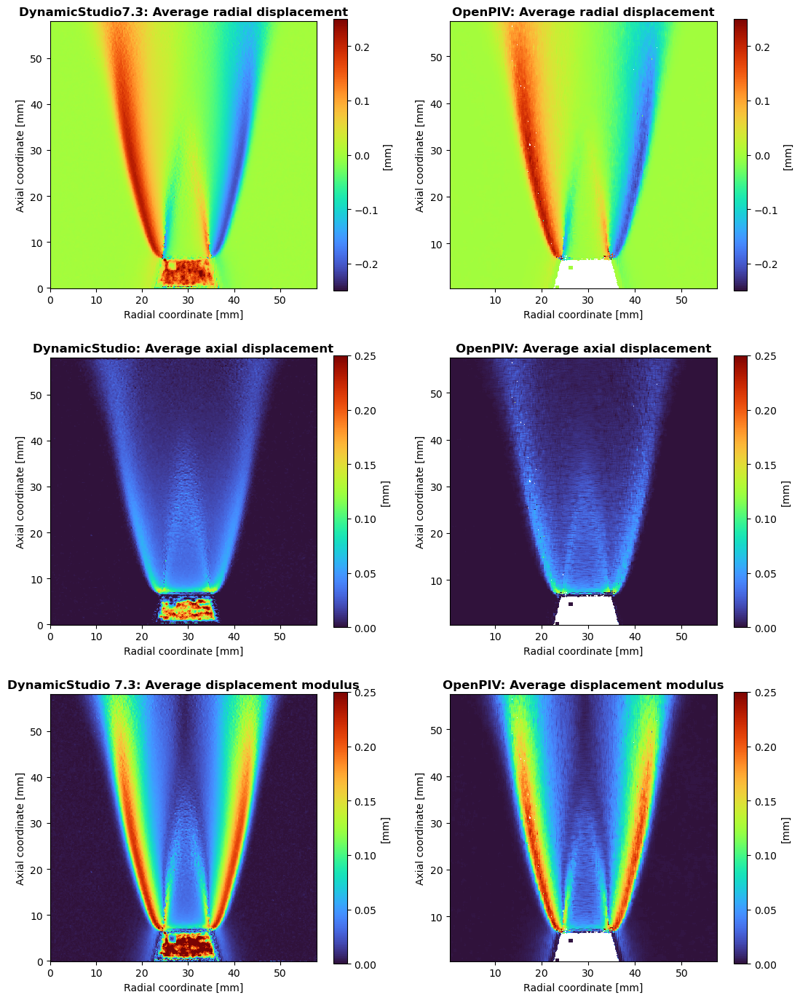

In [28]:
fig, ax = plt.subplots(3, 2, figsize=(13,17))

im = ax[(0,0)].pcolormesh(ds_cent_x, ds_cent_y, ds_rad_disp, vmin=-0.25, vmax=0.25, cmap="turbo")
ax[(0,0)].set_title("DynamicStudio7.3: Average radial displacement", fontweight='bold')
ax[(0,0)].set_xlabel("Radial coordinate [mm]")
ax[(0,0)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(0,0)], label="[mm]", shrink=0.97)
ax[(0,0)].set_aspect("equal")

im = ax[(1,0)].pcolormesh(ds_cent_x, ds_cent_y, ds_ax_disp, vmin=0, vmax=0.25, cmap="turbo")
ax[(1,0)].set_title("DynamicStudio: Average axial displacement", fontweight='bold')
ax[(1,0)].set_xlabel("Radial coordinate [mm]")
ax[(1,0)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(1,0)], label="[mm]", shrink=0.97)
ax[(1,0)].set_aspect("equal")

im = ax[(2,0)].pcolormesh(ds_cent_x, ds_cent_y, ds_mod_disp, vmin=0, vmax=0.25, cmap="turbo")
ax[(2,0)].set_title("DynamicStudio 7.3: Average displacement modulus", fontweight='bold')
ax[(2,0)].set_xlabel("Radial coordinate [mm]")
ax[(2,0)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(2,0)], label="[mm]", shrink=0.97)
ax[(2,0)].set_aspect("equal")

im = ax[(0,1)].pcolormesh(opiv_cent_x, opiv_cent_y, opiv_rad_disp, vmin=-0.25, vmax=0.25, cmap="turbo")
ax[(0,1)].set_title("OpenPIV: Average radial displacement", fontweight='bold')
ax[(0,1)].set_xlabel("Radial coordinate [mm]")
ax[(0,1)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(0,1)], label="[mm]", shrink=0.97)
ax[(0,1)].set_aspect("equal")

im = ax[(1,1)].pcolormesh(opiv_cent_x, opiv_cent_y, opiv_ax_disp, vmin=0, vmax=0.25, cmap="turbo")
ax[(1,1)].set_title("OpenPIV: Average axial displacement", fontweight='bold')
ax[(1,1)].set_xlabel("Radial coordinate [mm]")
ax[(1,1)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(1,1)], label="[mm]", shrink=0.97)
ax[(1,1)].set_aspect("equal")

im = ax[(2,1)].pcolormesh(opiv_cent_x, opiv_cent_y, opiv_mod_disp, vmin=0, vmax=0.25, cmap="turbo")
ax[(2,1)].set_title("OpenPIV: Average displacement modulus", fontweight='bold')
ax[(2,1)].set_xlabel("Radial coordinate [mm]")
ax[(2,1)].set_ylabel("Axial coordinate [mm]")
fig.colorbar(im, ax=ax[(2,1)], label="[mm]", shrink=0.97)
ax[(2,1)].set_aspect("equal")

#### 4.4.3 Comparison of displacement profiles
It could be interesting to extract the displacement profiles at different flame heights in order to better visualize the displacement trends and to better compare the results of the two algorithms. Neverthless, the maps are discrete and for this reason it is necessary to interpolate between computed values to have those corresponding to the extraction height.
This can be performed with the function defined here. It has the following inputs: the discete displacement map, the extraction height and the X and Y coordinates. The function gives the extracted profile at the choosen flame height as output. Note that the height input can be a vector of multiple extraction heights. The function used for the interpolation is comprised in the Scipy module and a linear-type interpolation has been choosen, but other options can be set.

In [31]:
def extract_profile(map, height, x_coordinates, y_coordinates):
    h_extract = height
    new_profiles = np.zeros((np.size(height),np.size(x_coordinates)))
    
    from scipy import interpolate
    
    for j in np.arange(0, np.size(height)) :

        for i in np.arange(0, np.size(y_coordinates)):
            
            f = interpolate.interp1d(y_coordinates, map[:,i], kind='linear')
            new_profiles [j,i] = f(h_extract[j])
        
    return new_profiles

Moreover, it is necessary to understand at which image height is located the last row corresponding to the Bunsen burner rim. This is necessary to extract at the correct flame height.  
For this reason it is possible to zoom the maps in the region in which the flame is attached to the burner by changing the limits of the radial and axial axis.
The images will suggest that the height at which it is located the Bunsen rim corresponds to about 6.5 millimeters axial coordinate (red line).

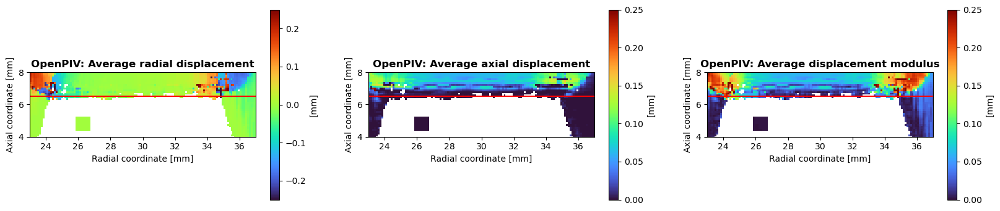

In [32]:
fig, ax = plt.subplots(1, 3, figsize=(20, 4))

im = ax[0].pcolormesh(opiv_cent_x, opiv_cent_y, opiv_rad_disp, vmin=-0.25, vmax=0.25, cmap="turbo")
ax[0].plot(opiv_cent_x[0,:],6.5*np.ones(np.size(opiv_cent_x[0,:])), 'r-')
ax[0].set_title("OpenPIV: Average radial displacement", fontweight='bold')
ax[0].set_xlabel("Radial coordinate [mm]")
ax[0].set_ylabel("Axial coordinate [mm]")
ax[0].set_xlim(23,37)
ax[0].set_ylim(4,8)
fig.colorbar(im, ax=ax[0], label="[mm]")
ax[0].set_aspect("equal")

im = ax[1].pcolormesh(opiv_cent_x, opiv_cent_y, opiv_ax_disp, vmin=0, vmax=0.25, cmap="turbo")
ax[1].plot(opiv_cent_x[0,:],6.5*np.ones(np.size(opiv_cent_x[0,:])), 'r-')
ax[1].set_title("OpenPIV: Average axial displacement", fontweight='bold')
ax[1].set_xlabel("Radial coordinate [mm]")
ax[1].set_ylabel("Axial coordinate [mm]")
ax[1].set_xlim(23,37)
ax[1].set_ylim(4,8)
fig.colorbar(im, ax=ax[1], label="[mm]")
ax[1].set_aspect("equal")

im = ax[2].pcolormesh(opiv_cent_x, opiv_cent_y, opiv_mod_disp, vmin=0, vmax=0.25, cmap="turbo")
ax[2].plot(opiv_cent_x[0,:],6.5*np.ones(np.size(opiv_cent_x[0,:])), 'r-')
ax[2].set_title("OpenPIV: Average displacement modulus", fontweight='bold')
ax[2].set_xlabel("Radial coordinate [mm]")
ax[2].set_ylabel("Axial coordinate [mm]")
ax[2].set_xlim(23,37)
ax[2].set_ylim(4,8)
fig.colorbar(im, ax=ax[2], label="[mm]")
ax[2].set_aspect("equal")

At this point, it is possible to set the extraction heights at which the displacement profiles should be evaluated but taking into account what said above. To extract the diplacement profiles at the choosen flame height it is necessary to extract at *h_extraction + h_bunsen*.  
In the following, it is choosen to extract at three flame heights and thus three profiles for radial and axial displacement maps for each cross-correlation algorithms are obtained.

In [22]:
# Extract displacement profiles
h_extraction = np.array([10,20,30]) #[mm]
h_bunsen = 6.5 #[mm]

opiv_extr_rad_profiles = extract_profile(opiv_rad_disp, h_extraction+h_bunsen, opiv_cent_x[0,:], opiv_cent_y[:,0])
opiv_extr_ax_profiles = extract_profile(opiv_ax_disp, h_extraction+h_bunsen, opiv_cent_x[0,:], opiv_cent_y[:,0])

ds_extr_rad_profiles = extract_profile(ds_rad_disp, h_extraction+h_bunsen, ds_cent_x[0,:], ds_cent_y[:,0])
ds_extr_ax_profiles = extract_profile(ds_ax_disp, h_extraction+h_bunsen, ds_cent_x[0,:], ds_cent_y[:,0])

In the following part, the radial displacement profiles computed at the same flame height for both OpenPIV and DynamicStudio 7.3 are plotted against the radial coordinate.
The two radial displacement profiles seem to be compareble for all the considered flame heights.

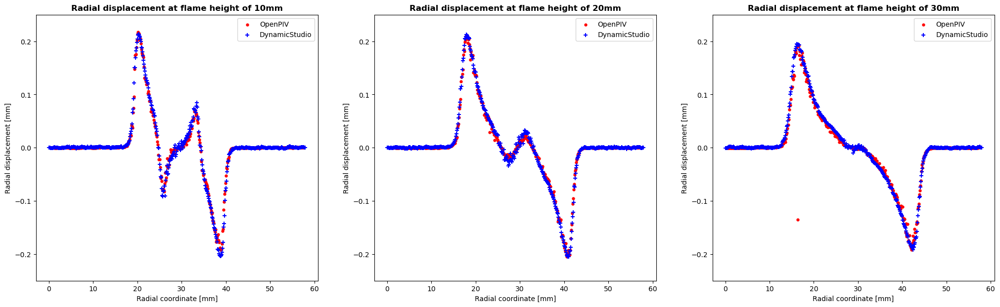

In [23]:
fig, ax = plt.subplots(1, 3, figsize=(25, 7))

ax[0].scatter(opiv_cent_x[0,:], opiv_extr_rad_profiles[0,:], marker='.', s=50, c='r', label='OpenPIV')
ax[0].scatter(ds_cent_x[0,:], ds_extr_rad_profiles[0,:], marker='+', s=40, c='b', label='DynamicStudio')
ax[0].set_title("Radial displacement at flame height of " + str(h_extraction[0]) + "mm", fontweight='bold')
ax[0].set_xlabel("Radial coordinate [mm]")
ax[0].set_ylabel("Radial displacement [mm]")
ax[0].set_ylim(-0.25,0.25)
ax[0].legend()

ax[1].scatter(opiv_cent_x[0,:], opiv_extr_rad_profiles[1,:], marker='.', s=50, c='r', label='OpenPIV')
ax[1].scatter(ds_cent_x[0,:], ds_extr_rad_profiles[1,:], marker='+', s=40, c='b', label='DynamicStudio')
ax[1].set_title("Radial displacement at flame height of " + str(h_extraction[1]) + "mm", fontweight='bold')
ax[1].set_xlabel("Radial coordinate [mm]")
ax[1].set_ylabel("Radial displacement [mm]")
ax[1].set_ylim(-0.25,0.25)
ax[1].legend()

ax[2].scatter(opiv_cent_x[2,:], opiv_extr_rad_profiles[2,:], marker='.', s=50, c='r', label='OpenPIV')
ax[2].scatter(ds_cent_x[2,:], ds_extr_rad_profiles[2,:], marker='+', s=40, c='b', label='DynamicStudio')
ax[2].set_title("Radial displacement at flame height of " + str(h_extraction[2]) + "mm", fontweight='bold')
ax[2].set_xlabel("Radial coordinate [mm]")
ax[2].set_ylabel("Radial displacement [mm]")
ax[2].set_ylim(-0.25,0.25)
ax[2].legend()

In the following script, the axial displacement profiles computed at the same flame height for both OpenPIV and DynamicStudio 7.3 are plotted against the radial coordinate. It is possible to notice that here the diffferences are more visible than the previous case.

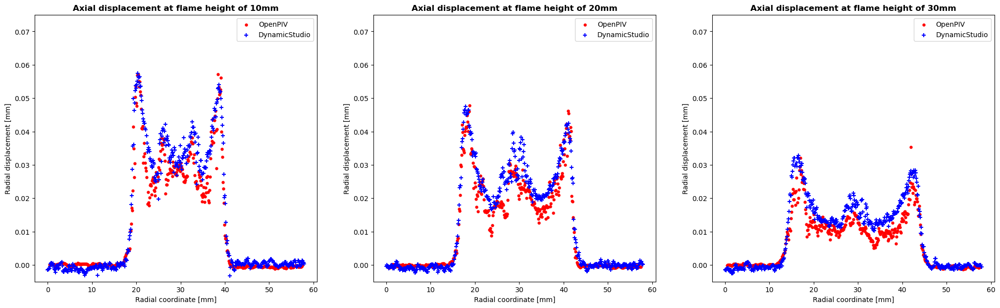

In [24]:
fig, ax = plt.subplots(1, 3, figsize=(25, 7))

ax[0].scatter(opiv_cent_x[0,:], opiv_extr_ax_profiles[0,:], marker='.', s=50, c='r', label='OpenPIV')
ax[0].scatter(ds_cent_x[0,:], ds_extr_ax_profiles[0,:], marker='+', s=40, c='b', label='DynamicStudio')
ax[0].set_title("Axial displacement at flame height of " + str(h_extraction[0]) + "mm", fontweight='bold')
ax[0].set_xlabel("Radial coordinate [mm]")
ax[0].set_ylabel("Radial displacement [mm]")
ax[0].set_ylim(-0.005,0.075)
ax[0].legend()

ax[1].scatter(opiv_cent_x[0,:], opiv_extr_ax_profiles[1,:], marker='.', s=50, c='r', label='OpenPIV')
ax[1].scatter(ds_cent_x[0,:], ds_extr_ax_profiles[1,:], marker='+', s=40, c='b', label='DynamicStudio')
ax[1].set_title("Axial displacement at flame height of " + str(h_extraction[1]) + "mm", fontweight='bold')
ax[1].set_xlabel("Radial coordinate [mm]")
ax[1].set_ylabel("Radial displacement [mm]")
ax[1].set_ylim(-0.005,0.075)
ax[1].legend()

ax[2].scatter(opiv_cent_x[2,:], opiv_extr_ax_profiles[2,:], marker='.', s=50, c='r', label='OpenPIV')
ax[2].scatter(ds_cent_x[2,:], ds_extr_ax_profiles[2,:], marker='+', s=40, c='b', label='DynamicStudio')
ax[2].set_title("Axial displacement at flame height of " + str(h_extraction[2]) + "mm", fontweight='bold')
ax[2].set_xlabel("Radial coordinate [mm]")
ax[2].set_ylabel("Radial displacement [mm]")
ax[2].set_ylim(-0.005,0.075)
ax[2].legend()

## 5. Conclusions

The objective of the present work was to compare the results of two different cross-correlation algorithms applied to the images of a Bunsen premixed air-hydrogen flame acquired during the experimental campaign led in the "Laboratory of Combustion and Optical Diagnostic Techniques" of the Departement of Energy.  
The first software is DynamicStudio 7.3 developed by Dantec, while the second one is an open-source software called OpenPIV. In particular, the displacement maps computed by DynamiStudio 7.3 are obtained on a different computer and have been exported and then uploaded here to run a comparison.  
In the fourth chapter, it is reported the script used to compute the displacement maps with OpenPIV.
Firstly, it has been necessary to test OpenPIV with synthetic displacements in order to test if the program works in the proper way. Then 100 couples of images are analysed by cross-correlation to obtain the radial and axial displacement maps. These are then used to compute the average displacement maps. Lastly, axial and radial component of the displcament maps are extracted at different flame height thanks to the introduction of a funtion. The as obtained profiles are compered at three flame heights. It can be concluded that not relevant differences can be noticed between radial profiles computed with both the algorthms. Neverthless, the axial displacement profiles show significative differences in the region of maxima and minima.  
In future, the script will be analysed more deeply to understand better where the observed differences are generated and if the cross-correlation settings can be modified to obtain more comparable results.